![visioncolab](https://drive.google.com/uc?export=view&id=10UMKqKSnU2grmitxYxvL7V6GVMu8RrpP)


`Google colab's for image processing, pattern recognition and computer vision`

[Domingo Mery](https://domingomery.ing.puc.cl/) - Department of Computer Science - Universidad Católica de Chile

# Filtering in Image Processing using Masks

# Libraries


In [ ]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# 1) Basic Examples

--2025-09-02 15:44:17--  https://www.dropbox.com/s/riy5tlccwc44fo7/rice64.png
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:601c:18::a27d:612
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/ec7qur202jy1kostv6dsy/rice64.png?rlkey=98f5lvks6geve7e9qxteik35c [following]
--2025-09-02 15:44:18--  https://www.dropbox.com/scl/fi/ec7qur202jy1kostv6dsy/rice64.png?rlkey=98f5lvks6geve7e9qxteik35c
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc8e93044aa37f3222511df154a9.dl.dropboxusercontent.com/cd/0/inline/Cwk5j02XOIUj57csmzL1cKnsh8cqeTb8EGV1BsnodsBm4LKGGeXvCyHsv26fIvgEmBY856K8AwJbCKl9wKqHesAMHKK1bR2Gt0kTbe5P7N3e-51xS7YSVH5EP7xz5PArev8/file# [following]
--2025-09-02 15:44:18--  https://uc8e93044aa37f3222511df154a9.dl.dropboxusercontent.com/cd/0/inline/Cwk5j02XOIUj57csmzL1cKnsh8cq

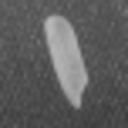

In [ ]:
!wget https://www.dropbox.com/s/riy5tlccwc44fo7/rice64.png
I = cv.imread('rice64.png',0)
cv2_imshow(I)

## 1.1) Average Mask (Low Pass Filter)

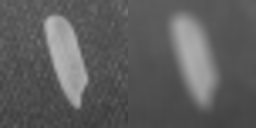

In [ ]:
n   = 15
Mk  = np.ones((n,n),np.float32)/n/n
L   = cv.filter2D(I,-1,Mk)
Z = np.concatenate((I,L),axis=1)
cv2_imshow(Z)

## 1.2) Gaussian Mask (Low Pass Filter)

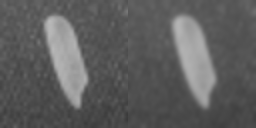

In [ ]:
width  = 15
s      = width/8.5
kernel = cv.getGaussianKernel(width, s)         # Gaussian width x 1  (width = size, s = sigma)
window = np.outer(kernel, kernel.transpose())   # Gaussian width x width
L      = cv.filter2D(I,-1,window)
Z      = np.concatenate((I,L),axis=1)
cv2_imshow(Z)

## 1.2) Horizontal Edges

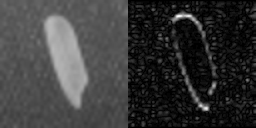

In [ ]:
Id = I.astype(float)

# 3x3 Y-direction  kernel
My = np.array([[ 0, -1,  0], [0, 0, 0], [0, 1, 0]])

# Filter the image using filter2D, which has inputs: (grayscale image, bit-depth, kernel)
Gy0 = cv.filter2D(Id, -1, My)

# Solo para visualización
Gy = np.abs(Gy0)
Gy = Gy/np.max(Gy)*255


Z = np.concatenate((Id,Gy),axis=1)
cv2_imshow(Z)


## 1.3) Vertical Edges

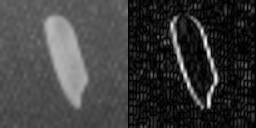

In [ ]:
Id = I.astype(float)

# 3 X 3 X-direction kernel
Mx = np.array([[ 0, 0, 0], [-1, 0, 1], [ 0, 0, 0]])

# Filter the image using filter2D, which has inputs: (grayscale image, bit-depth, kernel)
Gx0 = cv.filter2D(Id, -1, Mx)

Gx = np.abs(Gx0)
Gx = Gx/np.max(Gx)*255

Z = np.concatenate((Id,Gx),axis=1)
cv2_imshow(Z)


## 1.4) Both edges (horizontal & vertical)

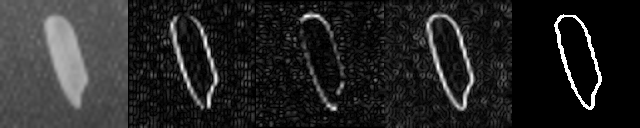

In [ ]:
G = np.sqrt(np.multiply(Gx0,Gx0) + np.multiply(Gy0,Gy0))
G = G/np.max(G)*255
E = (G>125)*255

Z = np.concatenate((Id,Gx,Gy,G,E),axis=1)
cv2_imshow(Z)

## 1.5) Sobel operator edge detection)

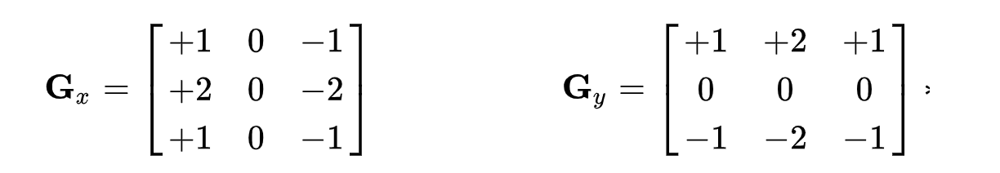

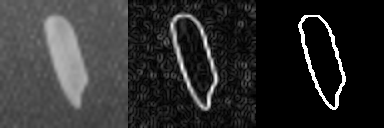

In [ ]:
Gx0 = cv.Sobel(Id,cv.CV_64F,1,0,ksize=3)
Gy0 = cv.Sobel(Id,cv.CV_64F,0,1,ksize=3)

G = np.sqrt(np.multiply(Gx0,Gx0) + np.multiply(Gy0,Gy0))
G = np.abs(G)
G = G/np.max(G)*255
E = (G>125)*255

Z = np.concatenate((Id,G,E),axis=1)
cv2_imshow(Z)

# 2) High Pass Filter

--2025-09-02 14:32:24--  https://www.dropbox.com/s/w7sk5faw51yn3lu/tokio_color.jpg
Resolving www.dropbox.com (www.dropbox.com)... 162.125.2.18, 2620:100:6017:18::a27d:212
Connecting to www.dropbox.com (www.dropbox.com)|162.125.2.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/nunda9pqg79ssqv7huz0r/tokio_color.jpg?rlkey=ux7zmi8n2gh291ag5o06jletl [following]
--2025-09-02 14:32:25--  https://www.dropbox.com/scl/fi/nunda9pqg79ssqv7huz0r/tokio_color.jpg?rlkey=ux7zmi8n2gh291ag5o06jletl
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc5f3a01b7718fd0f0d4e6105db5.dl.dropboxusercontent.com/cd/0/inline/CwnGtGJvvtzyAB0ejpVMTxmGBa2HJ8jWJ2YugGxObXYIb-SbftRB4GiJU_ApM36CCFT3_-CgvHEYGTjlgCBa9MGhkto9-MqUPSzvDQtDeDlVG5CjLwwiCGsrvcw1Euxxsp8/file# [following]
--2025-09-02 14:32:25--  https://uc5f3a01b7718fd0f0d4e6105db5.dl.dropboxusercontent.com/cd/0/inline/CwnGtGJvvtzyA

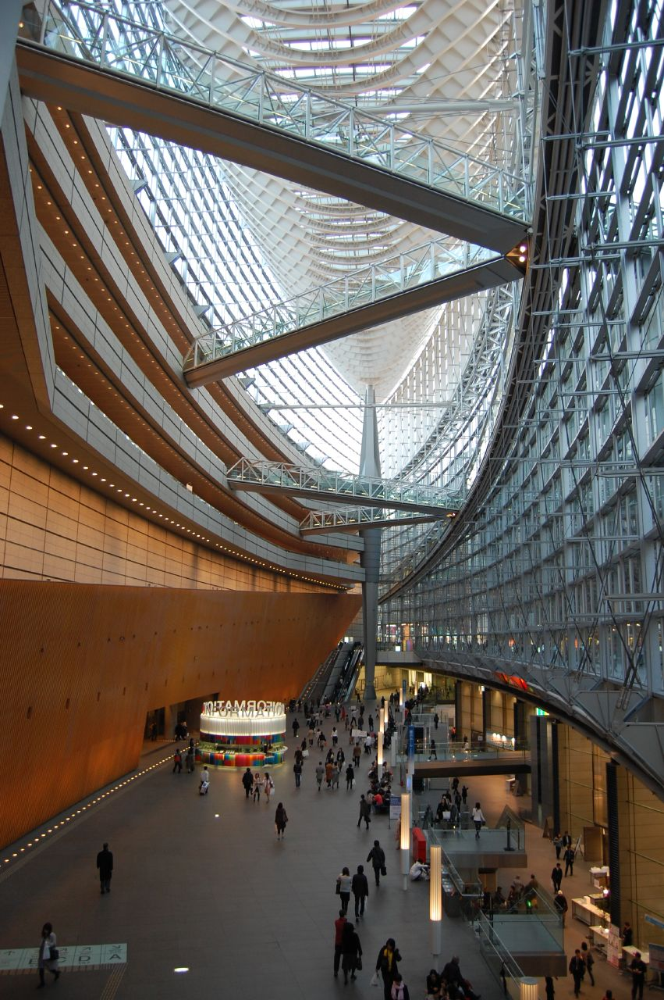

In [ ]:
# Input image
!wget https://www.dropbox.com/s/w7sk5faw51yn3lu/tokio_color.jpg
Icv = cv.imread('tokio_color.jpg')
cv2_imshow(Icv)

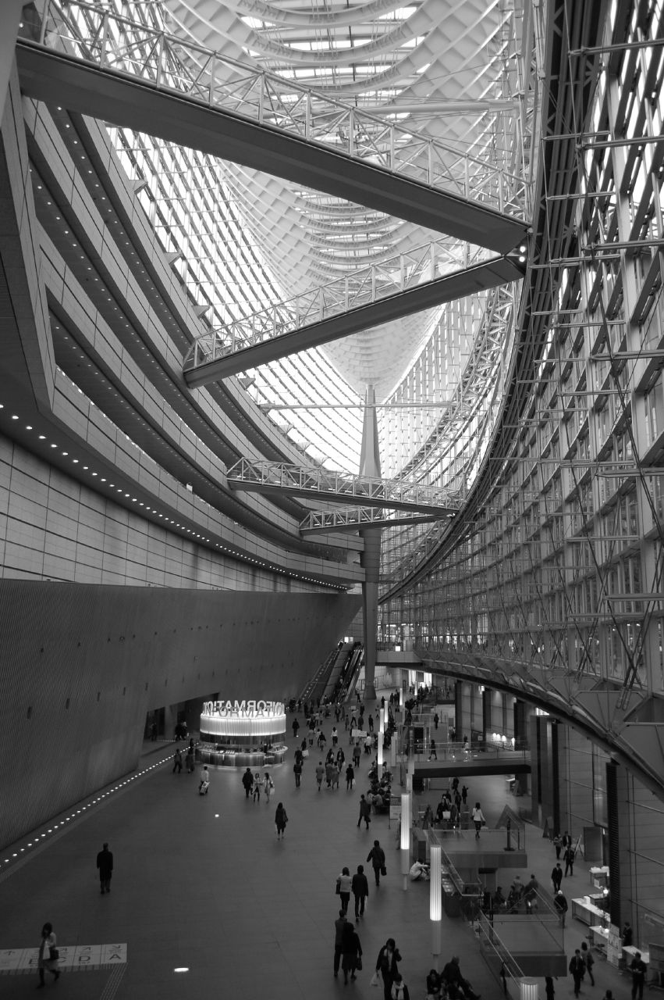

In [ ]:
# Conversion to grayscale
I = cv.cvtColor(Icv, cv.COLOR_BGR2GRAY)
cv2_imshow(I)

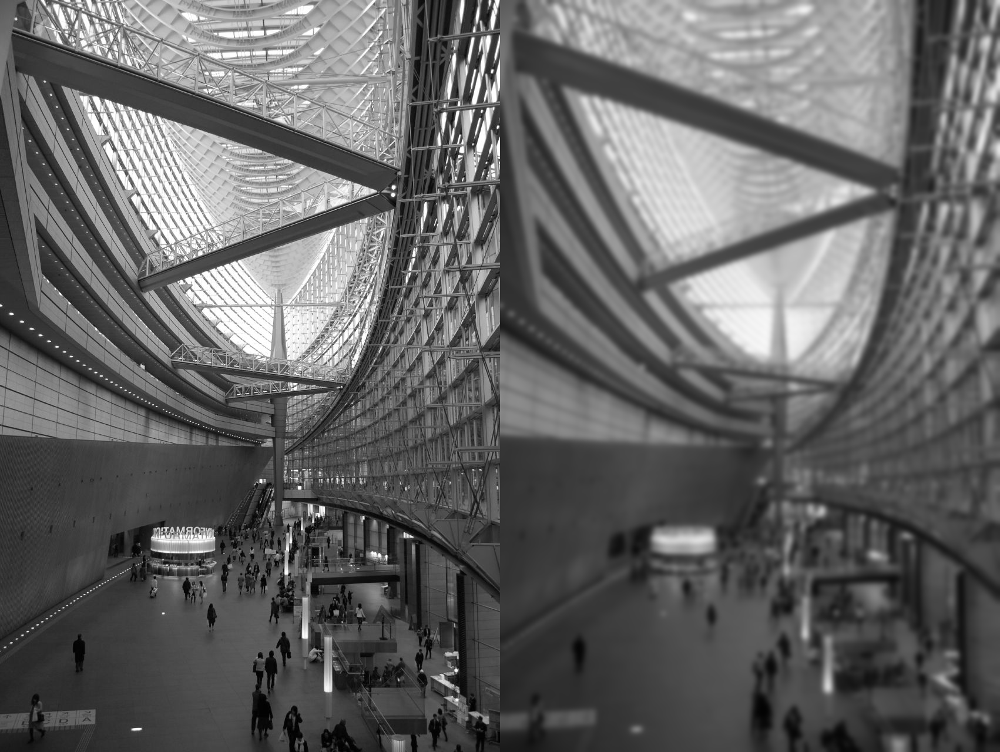

In [ ]:
# FGaussian Filtering
s      = 39
kernel = cv.getGaussianKernel(s, s/8.5)        # Gaussian s x 1  (s = size, s/8.5 = sigma)
window = np.outer(kernel, kernel.transpose())   # Gaussian s x s pixels
L      = cv.filter2D(I,-1,window)
Z      = np.concatenate((I,L),axis=1)
cv2_imshow(Z)

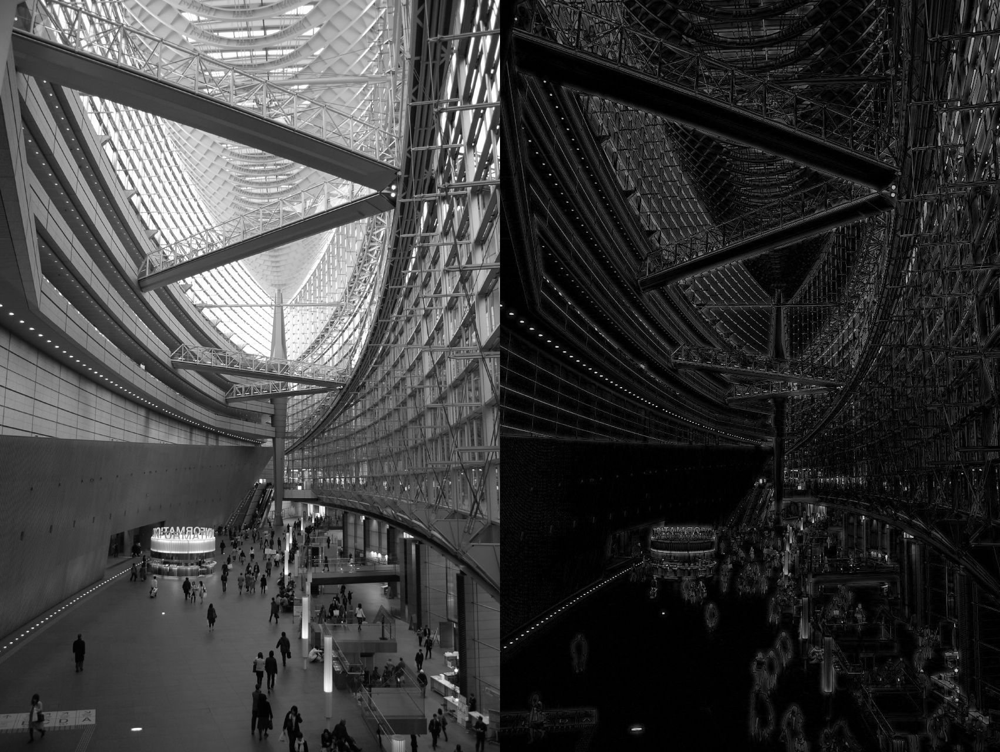

In [ ]:
# High Pass Filtering
Id = I.astype(float)
Ld = L.astype(float)
Hd = Id-Ld

# Visualization
H = np.abs(Hd)
H = H-np.min(H)
H = H/np.max(H)*255
Z = np.concatenate((I,H),axis=1)
cv2_imshow(Z)



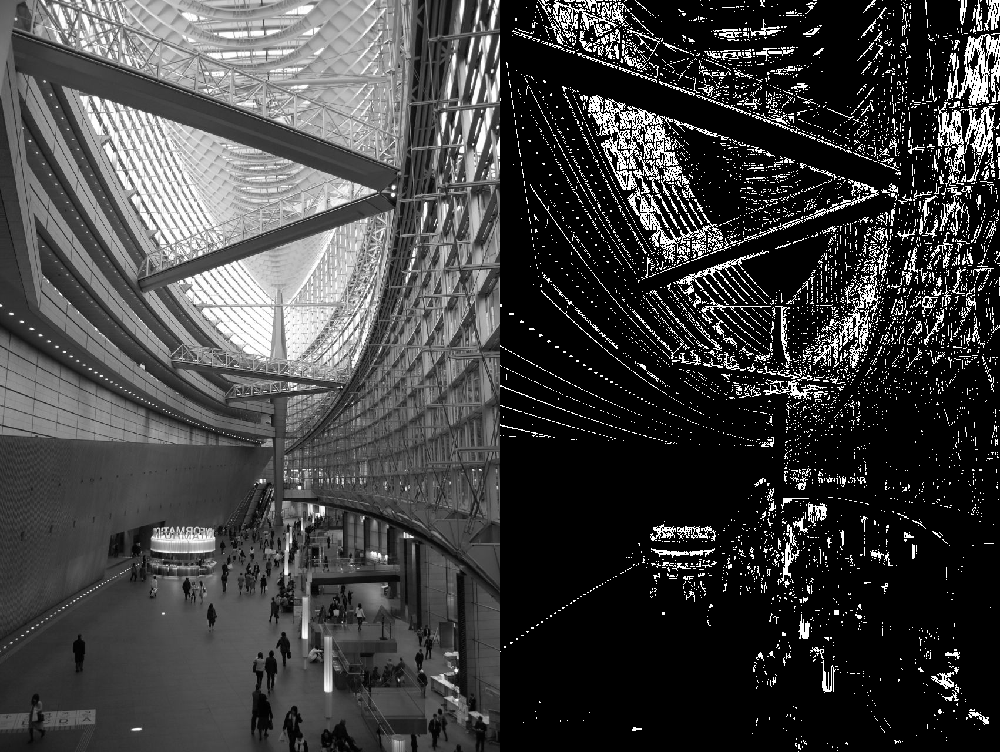

In [ ]:
# Edge detection using High Pass Filtering
E = (H>50)*255
Z = np.concatenate((I,E),axis=1)
cv2_imshow(Z)



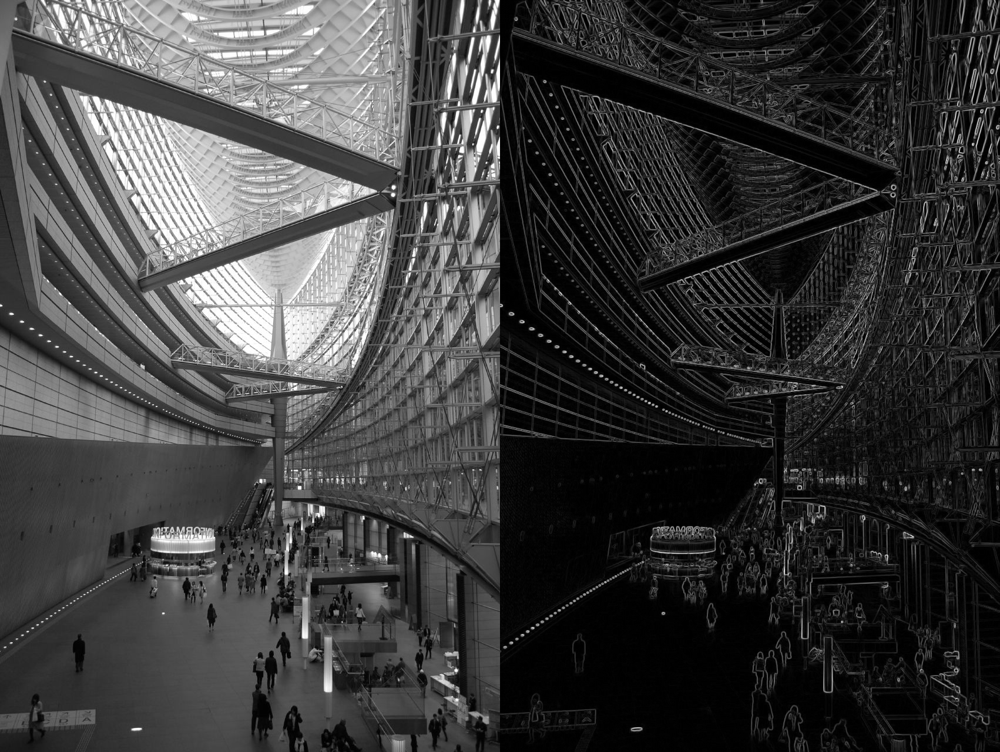

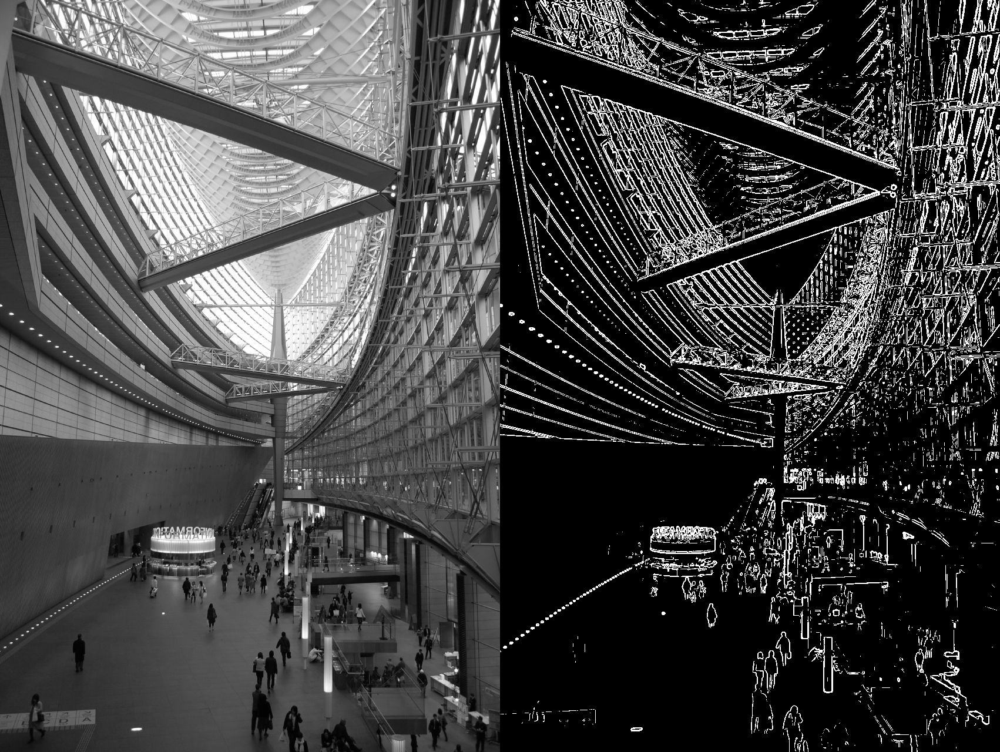

In [ ]:
# Edge detection using Edge Detection with Sobel
Id = I.astype(float)

Gx0 = cv.Sobel(Id,cv.CV_64F,1,0,ksize=3)
Gy0 = cv.Sobel(Id,cv.CV_64F,0,1,ksize=3)

G = np.sqrt(np.multiply(Gx0,Gx0) + np.multiply(Gy0,Gy0))
G = np.abs(G)
G = G/np.max(G)*255
E = (G>50)*255

Z = np.concatenate((I,G),axis=1)
cv2_imshow(Z)


Z = np.concatenate((I,E),axis=1)
cv2_imshow(Z)




Anothe visualization

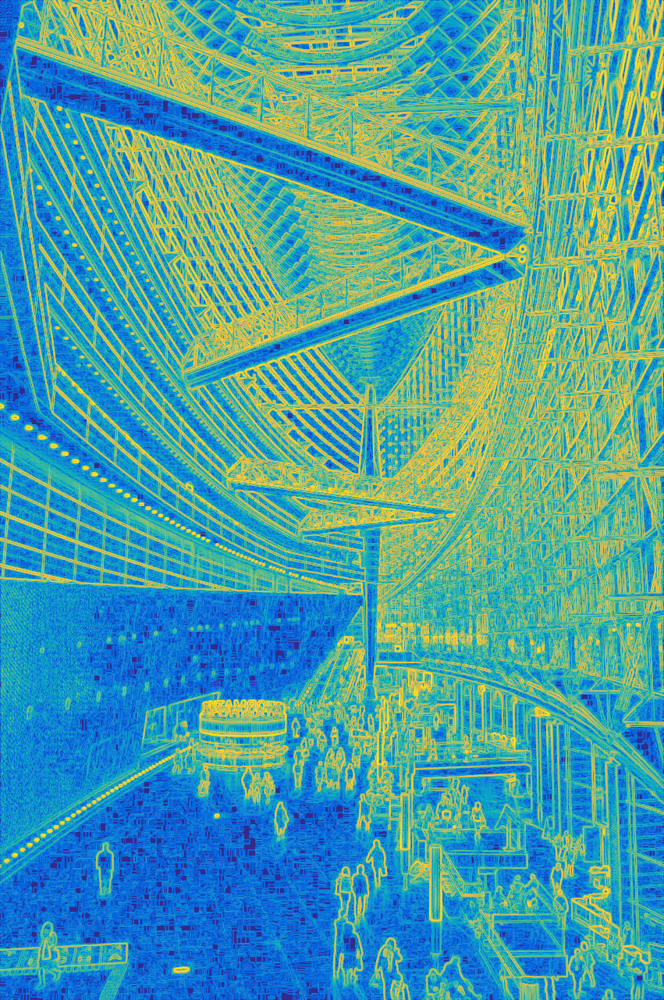

In [ ]:
L = np.log(G+1)
L = L/np.max(L)*255
Li = L.astype(np.uint8)


Lc = cv.applyColorMap(Li, cv.COLORMAP_PARULA)

cv2_imshow(Lc)


# 3) Sharpen Filtering

This is filter is used to enhance the smoothed details

In [ ]:
!wget https://www.dropbox.com/s/wu2fjmob9zfkrvl/moon.tif

--2025-09-02 14:49:20--  https://www.dropbox.com/s/wu2fjmob9zfkrvl/moon.tif
Resolving www.dropbox.com (www.dropbox.com)... 162.125.6.18, 2620:100:6018:18::a27d:312
Connecting to www.dropbox.com (www.dropbox.com)|162.125.6.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/4wts2m90zot95ac013kru/moon.tif?rlkey=n9gv2q8ytd54bzeuwo1lh8wot [following]
--2025-09-02 14:49:20--  https://www.dropbox.com/scl/fi/4wts2m90zot95ac013kru/moon.tif?rlkey=n9gv2q8ytd54bzeuwo1lh8wot
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc36a7faaa644890db91bab5bf6d.dl.dropboxusercontent.com/cd/0/inline/Cwnirr7hPreAD2HRnUh9n8CJVMJmukQNe7DVcrv2_HLwZ7W6JUjLrsOjC-BYtHIDzM4tgchpo-q9ubOKbapxrgF5vP6SqPt1iJ_gqcU1vDEvwP9PgovXSAoHmEMpPXlOIPc/file# [following]
--2025-09-02 14:49:21--  https://uc36a7faaa644890db91bab5bf6d.dl.dropboxusercontent.com/cd/0/inline/Cwnirr7hPreAD2HRnUh9n8CJVMJmukQNe7

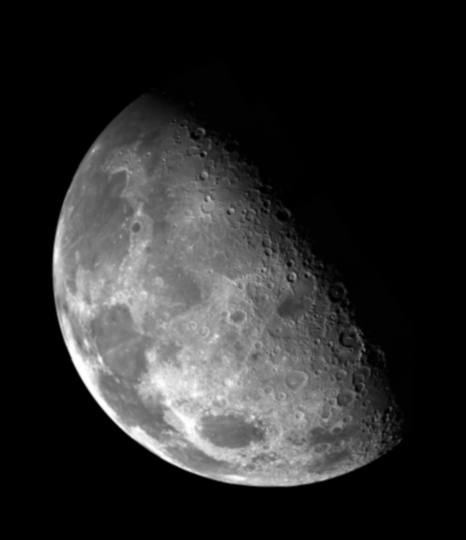

In [ ]:
# Original Image
I = cv.imread('moon.tif',0)
cv2_imshow(I)

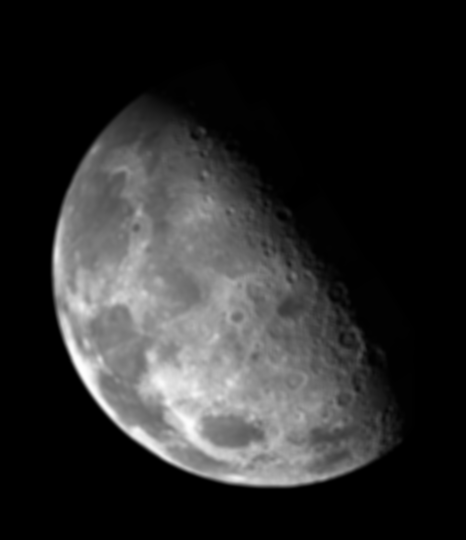

In [ ]:
# Filtered Image (low pass filter)
n   = 5
Mk  = np.ones((n,n),np.float32)/n/n
L   = cv.filter2D(I,-1,Mk)
cv2_imshow(L)

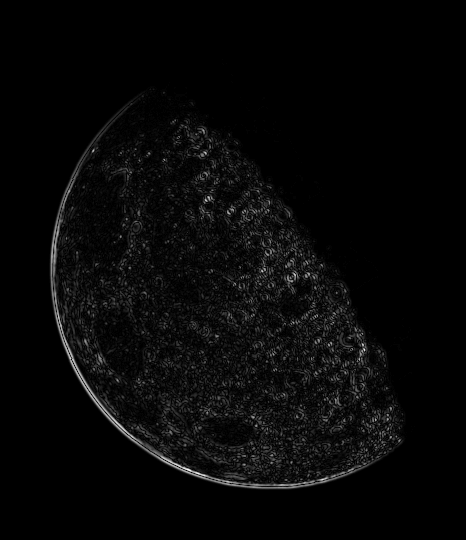

In [ ]:
# High pass filter
Id = I.astype(float)
Ld = L.astype(float)
Hd = Id-Ld

# Visualization
H = np.abs(Hd)
H = H-np.min(H)
H = H/np.max(H)*255
cv2_imshow(H)



Original (left) | Sharpen (right)


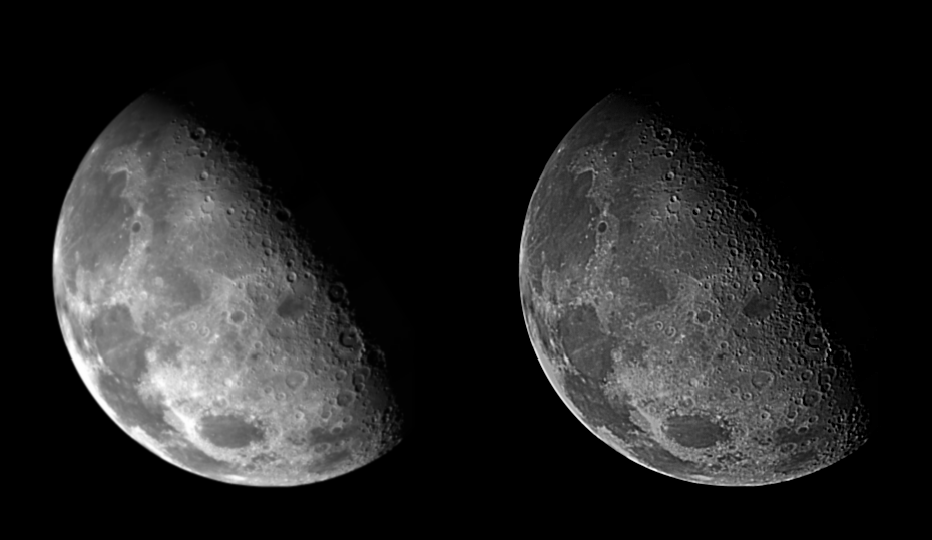

In [ ]:
# Sharpen: high pass pixels are amplified
Jd = Id + 3*Hd

Jd[Jd<0] = 0
Jd = Jd/np.max(Jd)*255

Z = np.concatenate((Id,Jd),axis=1)
print('Original (left) | Sharpen (right)')
cv2_imshow(Z)